<a href="https://colab.research.google.com/github/Alymostafa/Clustring_Practice/blob/master/clustring_practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from imutils import paths
import matplotlib.pyplot as plt
from IPython.display import Image, display
import numpy as np
import argparse
import cv2
import os
import shutil
import pandas as pd
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
import torch
from torch.autograd import Variable
from torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential, Conv2d, MaxPool2d, Module, Softmax, BatchNorm2d, Dropout
from torch.optim import Adam, SGD
from torch.utils.data import DataLoader
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import cv2
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import torch 
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms

import pandas as pd;
import nltk;
import numpy as np;
import re;
import time;
from nltk.corpus import stopwords;
import json;
import sys;
import pickle;
import gensim;
import matplotlib.pyplot as plt;
import seaborn as sns;
from sklearn import preprocessing;
from IPython.display import clear_output;
import gensim;
from gensim.models import KeyedVectors;
from sklearn.cluster import KMeans
from itertools import cycle
import itertools
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE 
!pip install chartify
import chartify

In [ ]:
def Elbow_k_mean(X):
  distortions = []
  K = range(1,10)
  for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X.reshape(-1,1))
    distortions.append(kmeanModel.inertia_)
      
  plt.figure(figsize=(16,8))
  plt.plot(K, distortions, 'bx-')
  plt.xlabel('k')
  plt.ylabel('Distortion')
  plt.title('The Elbow Method showing the optimal k')
  plt.show()

In [ ]:
copied_path = '/drive/My Drive/covid_data/linear_covid.zip'

In [ ]:
!unzip 'drive/My Drive/covid_data/linear_covid.zip'

Archive:  drive/My Drive/covid_data/linear_covid.zip
replace content/linear_covid/linear_covid15.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: content/linear_covid/linear_covid15.jpg  
  inflating: content/linear_covid/linear_covid84.jpg  
  inflating: content/linear_covid/linear_covid24.jpg  
  inflating: content/linear_covid/linear_covid67.jpg  
  inflating: content/linear_covid/linear_covid9.jpg  
  inflating: content/linear_covid/linear_covid17.jpg  
  inflating: content/linear_covid/linear_covid42.jpg  
  inflating: content/linear_covid/linear_covid0.jpg  
  inflating: content/linear_covid/linear_covid20.jpg  
  inflating: content/linear_covid/linear_covid52.jpg  
  inflating: content/linear_covid/linear_covid82.jpg  
  inflating: content/linear_covid/linear_covid86.jpg  
  inflating: content/linear_covid/linear_covid88.jpg  
  inflating: content/linear_covid/linear_covid62.jpg  
  inflating: content/linear_covid/linear_covid97.jpg  
  inflating: content/linear_covid/l

In [ ]:
args={}
dataset_1 = 'content/linear_covid'
args["dataset_1"] = dataset_1

[INFO] loading images...
 1 


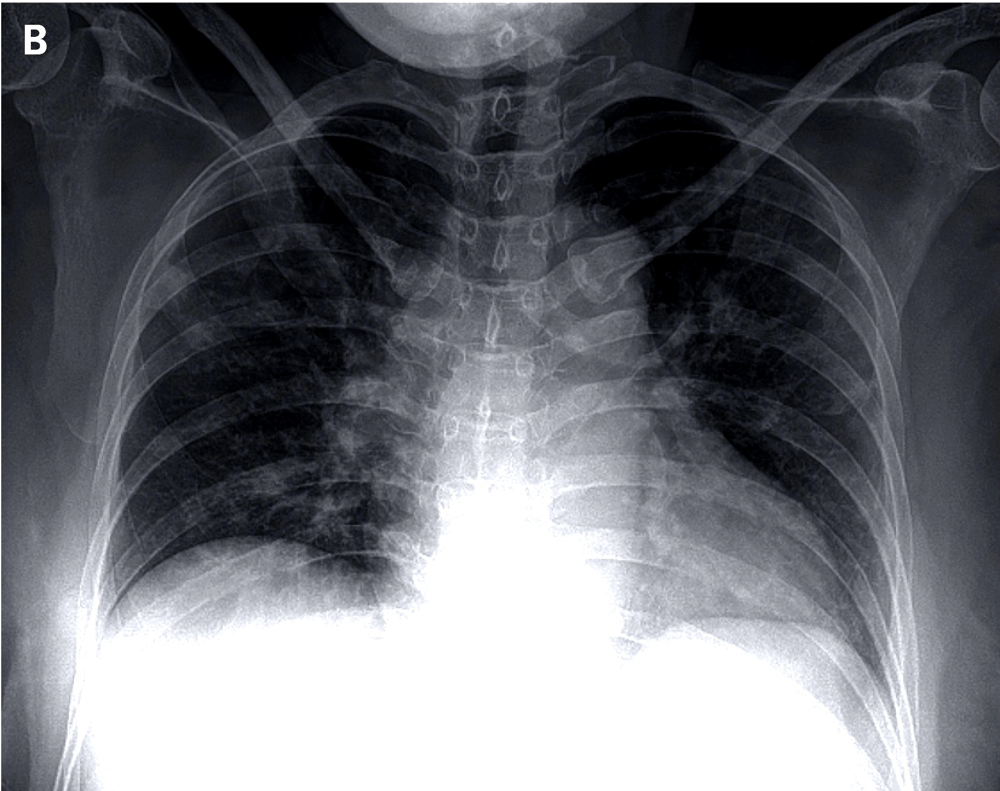

 2 


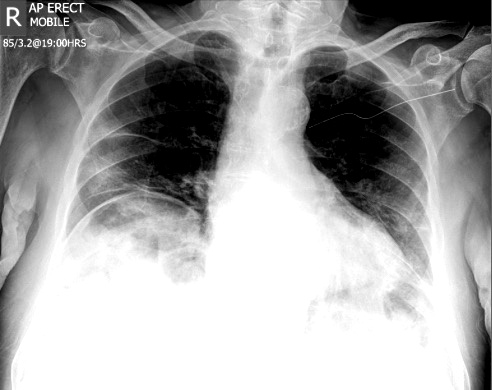

 3 


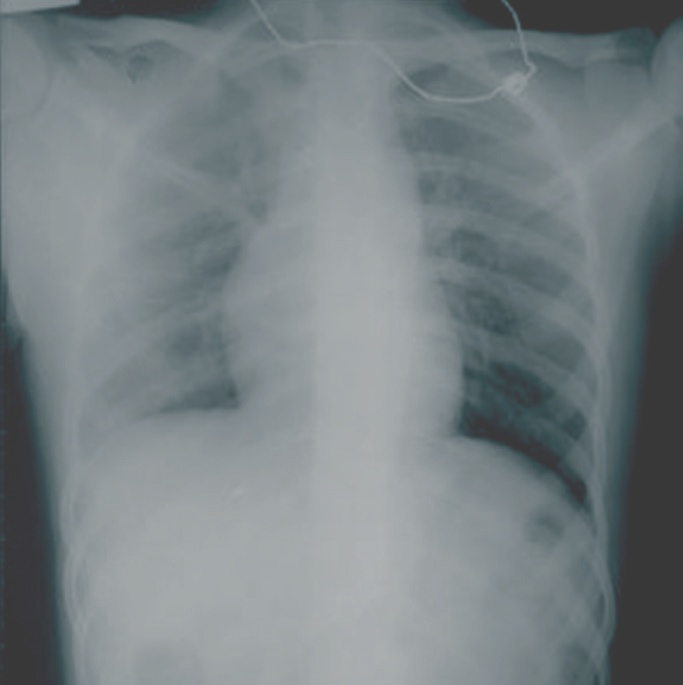

 4 


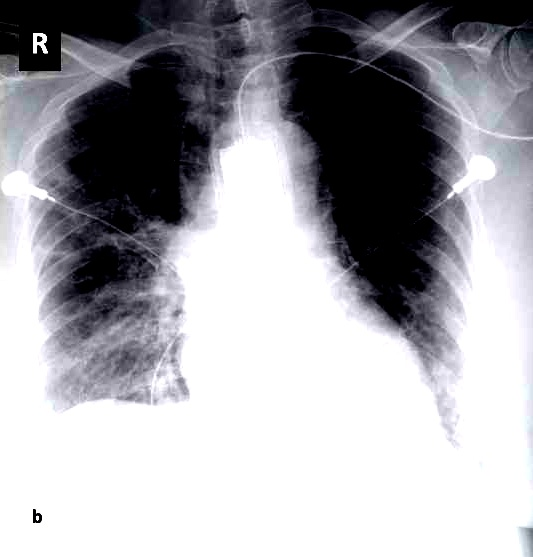

 5 


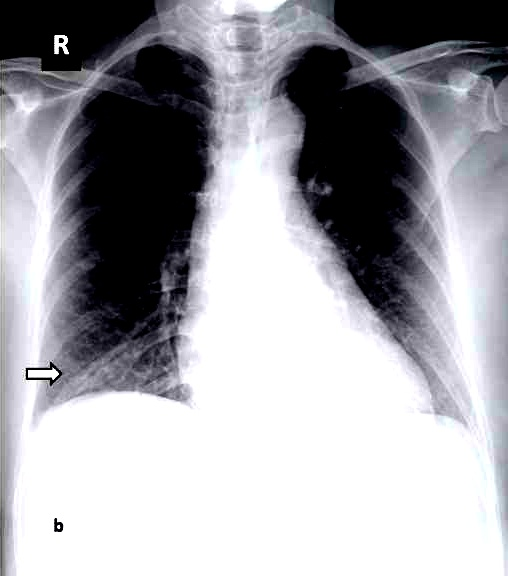

 6 


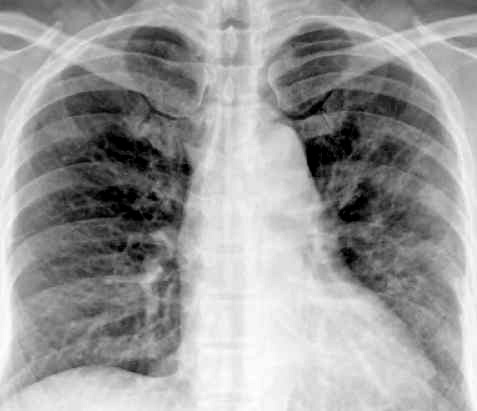

 7 


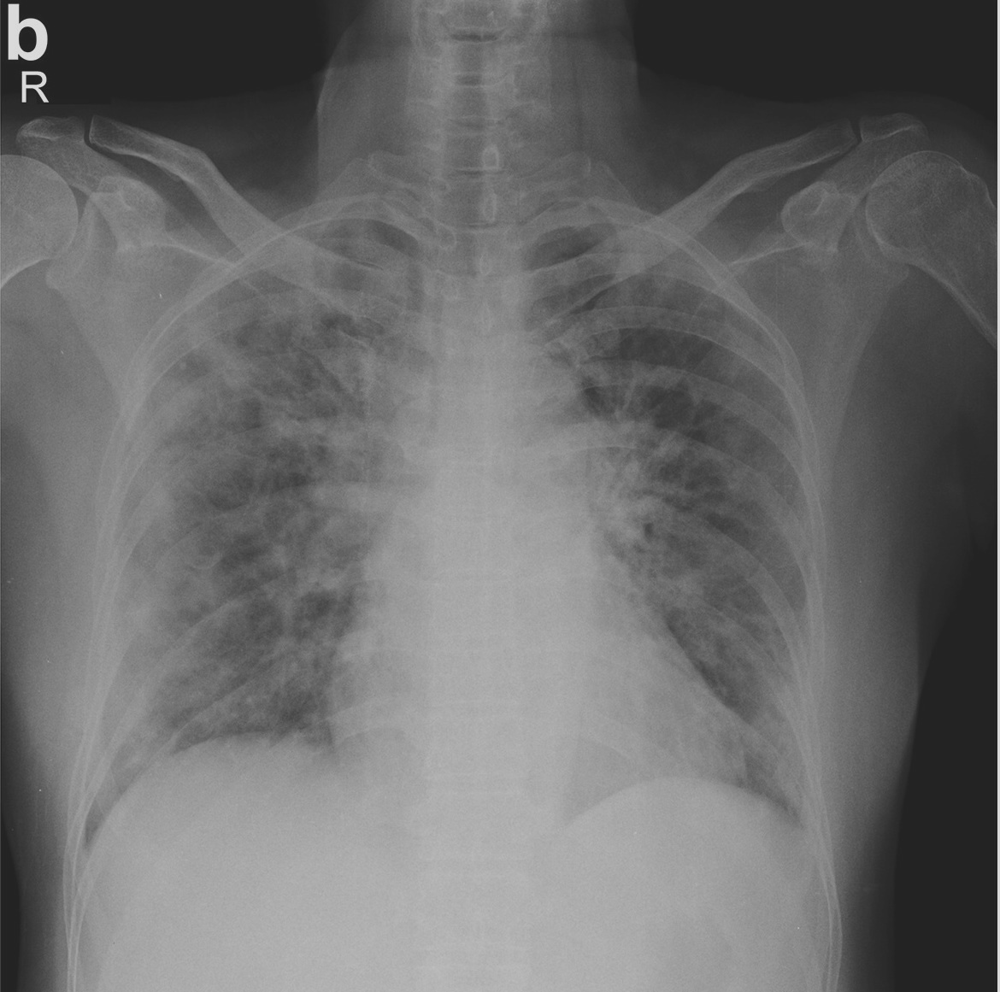

 8 


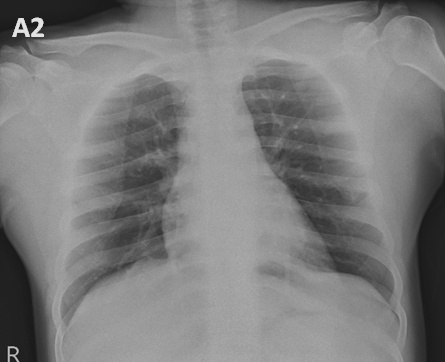

 9 


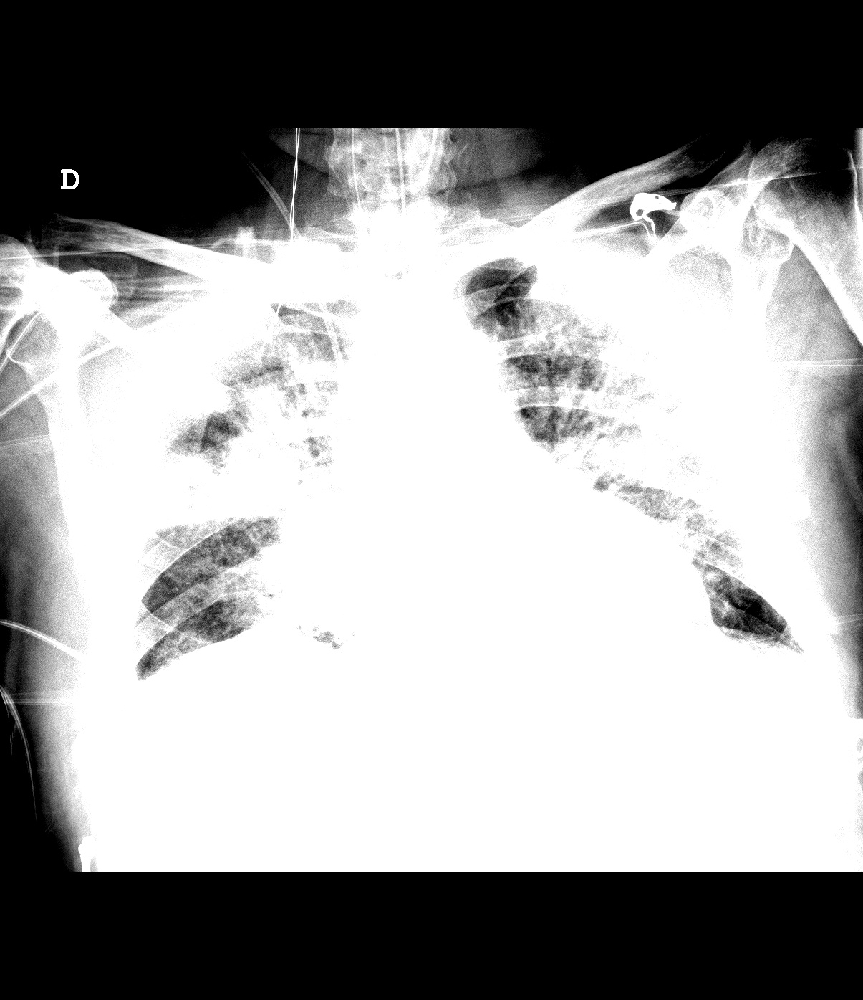

 10 


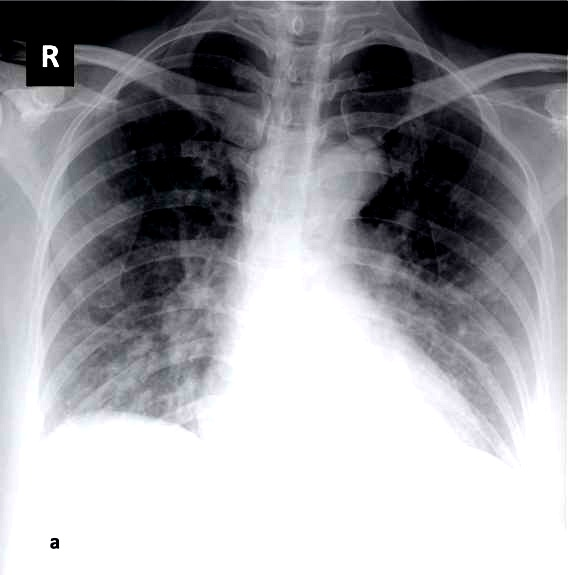

 11 


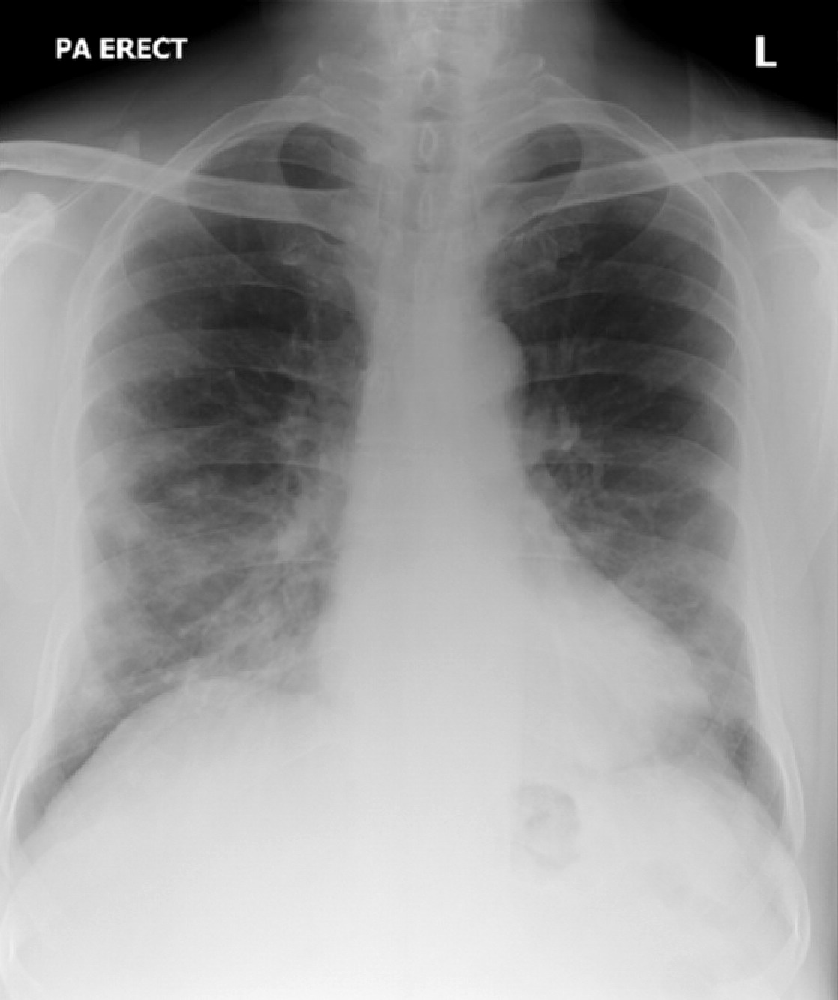

 12 


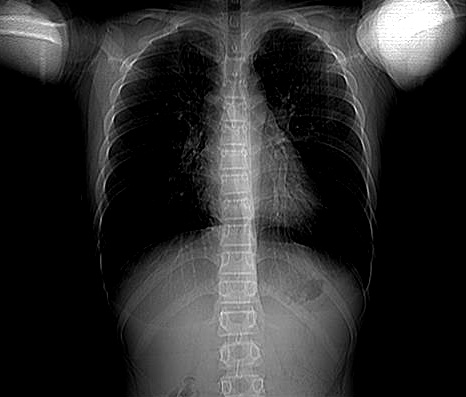

 13 


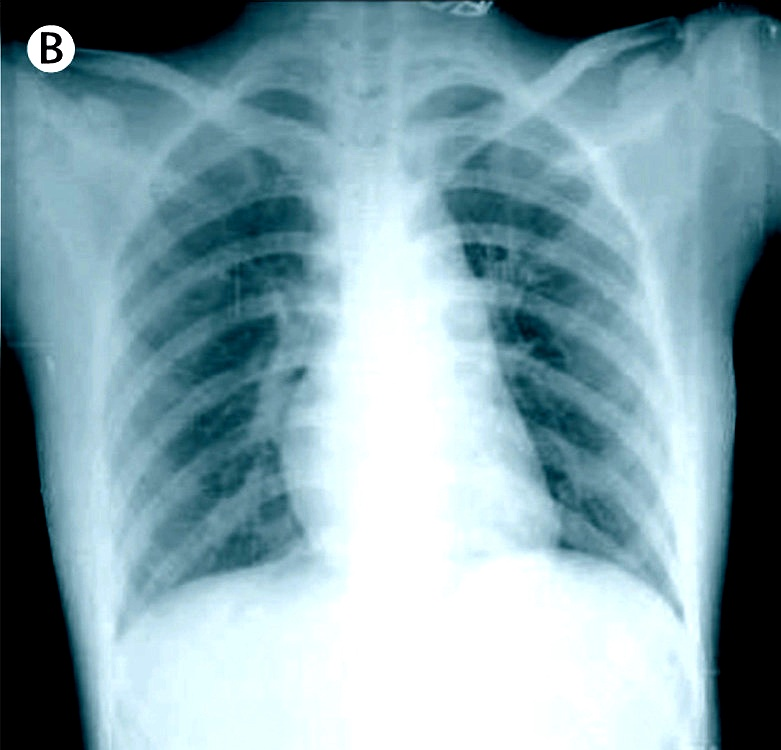

 14 


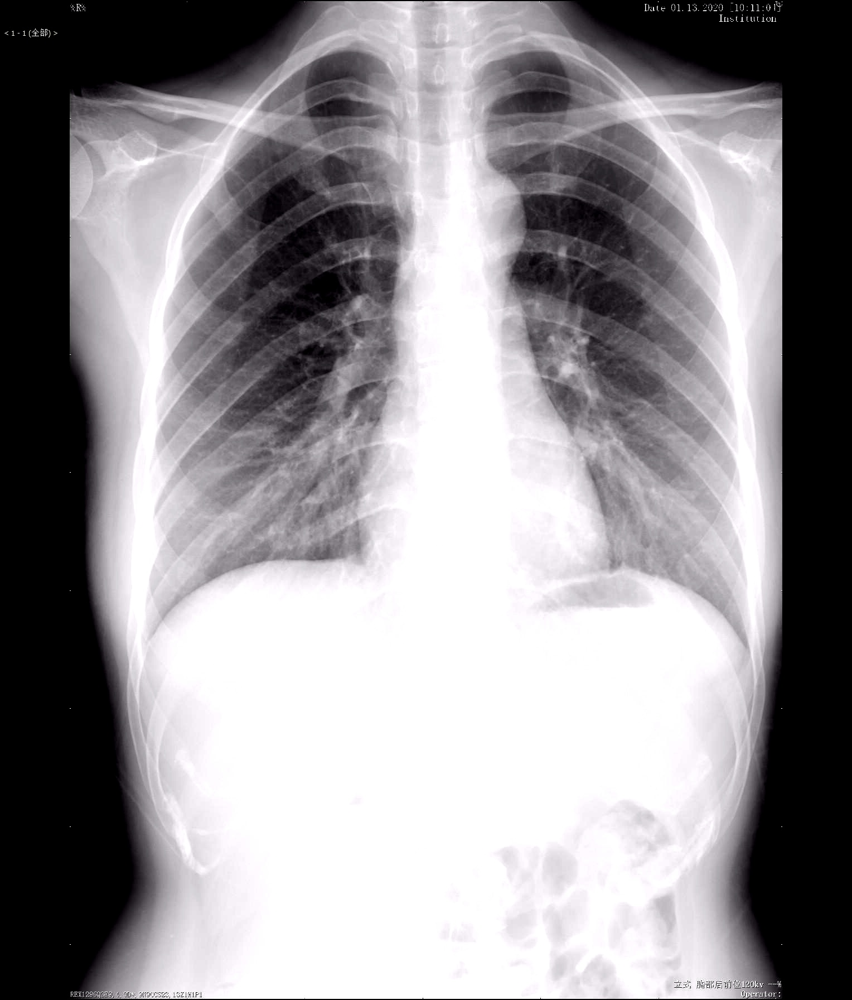

 15 


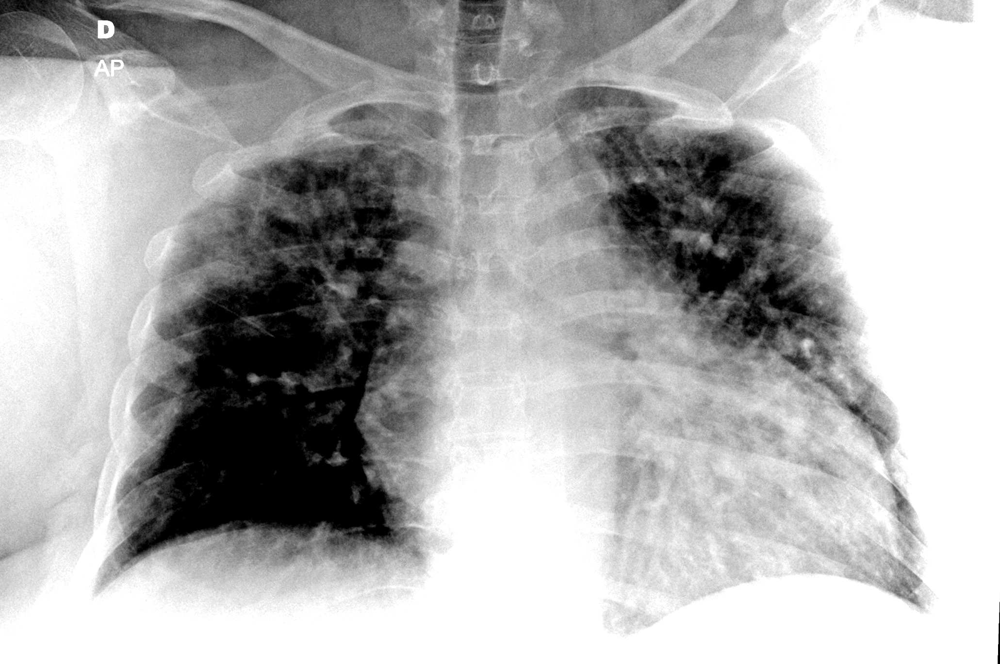

 16 


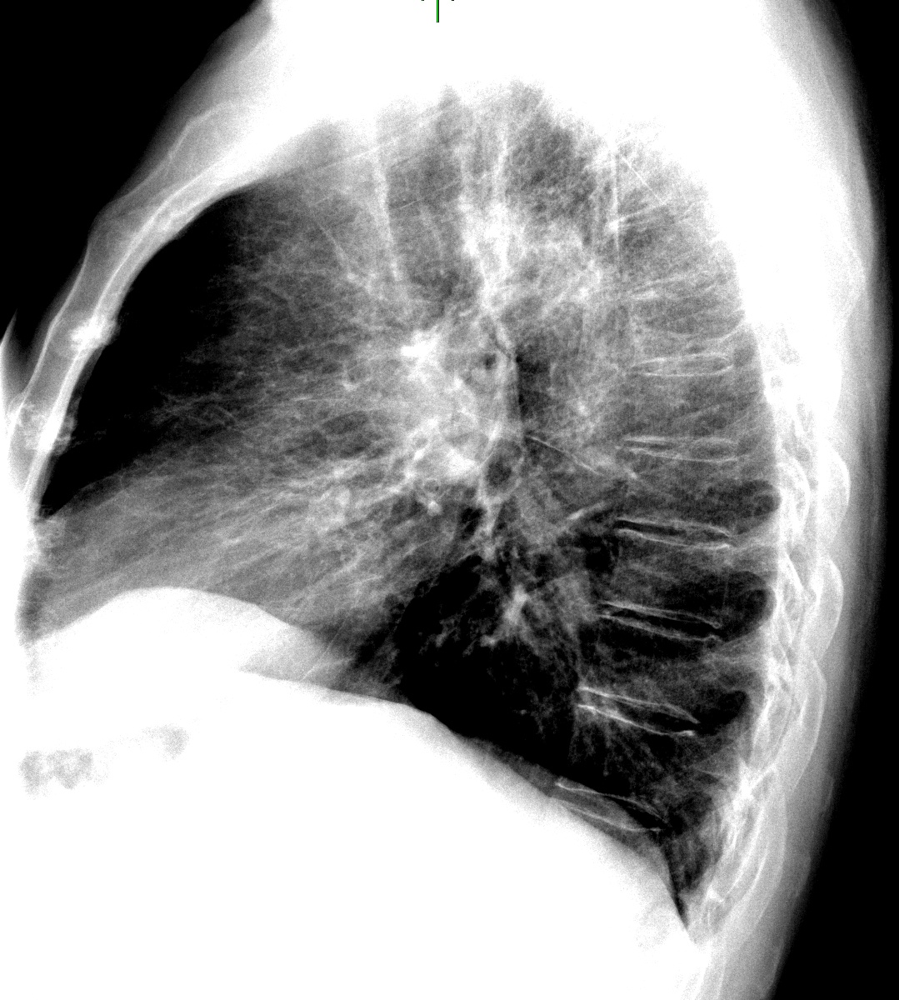

 17 


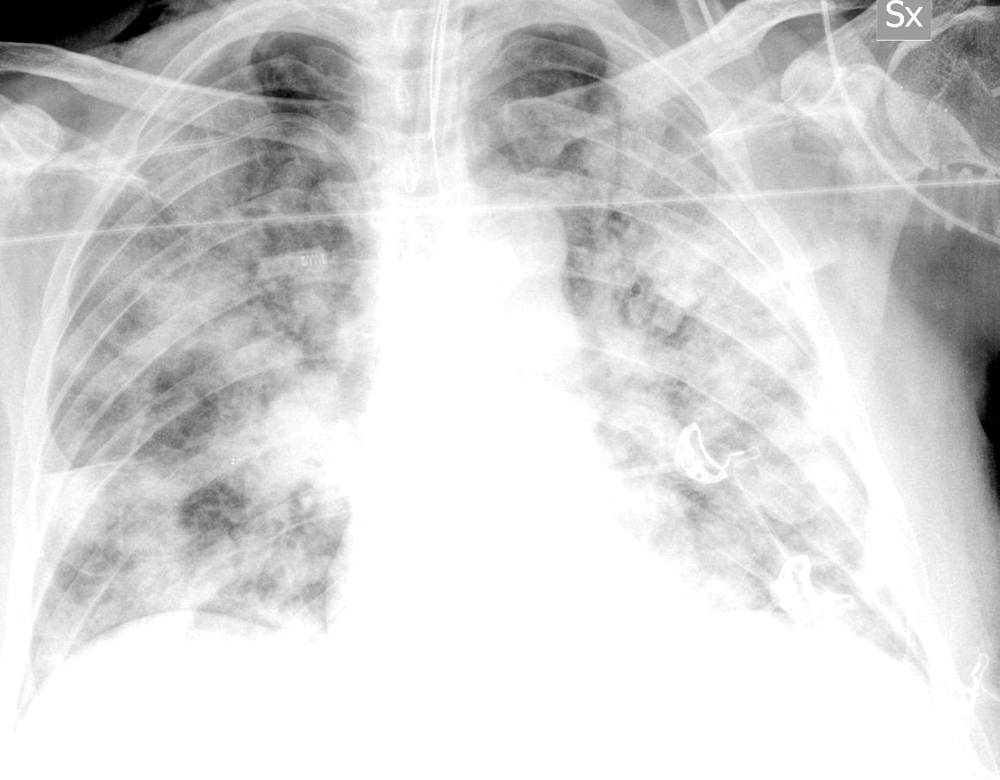

 18 


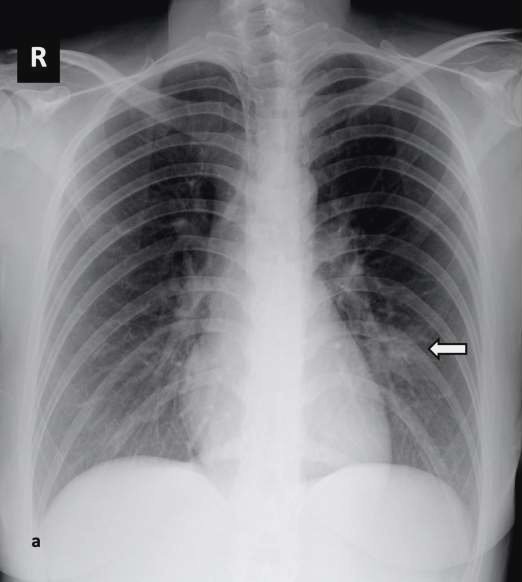

 19 


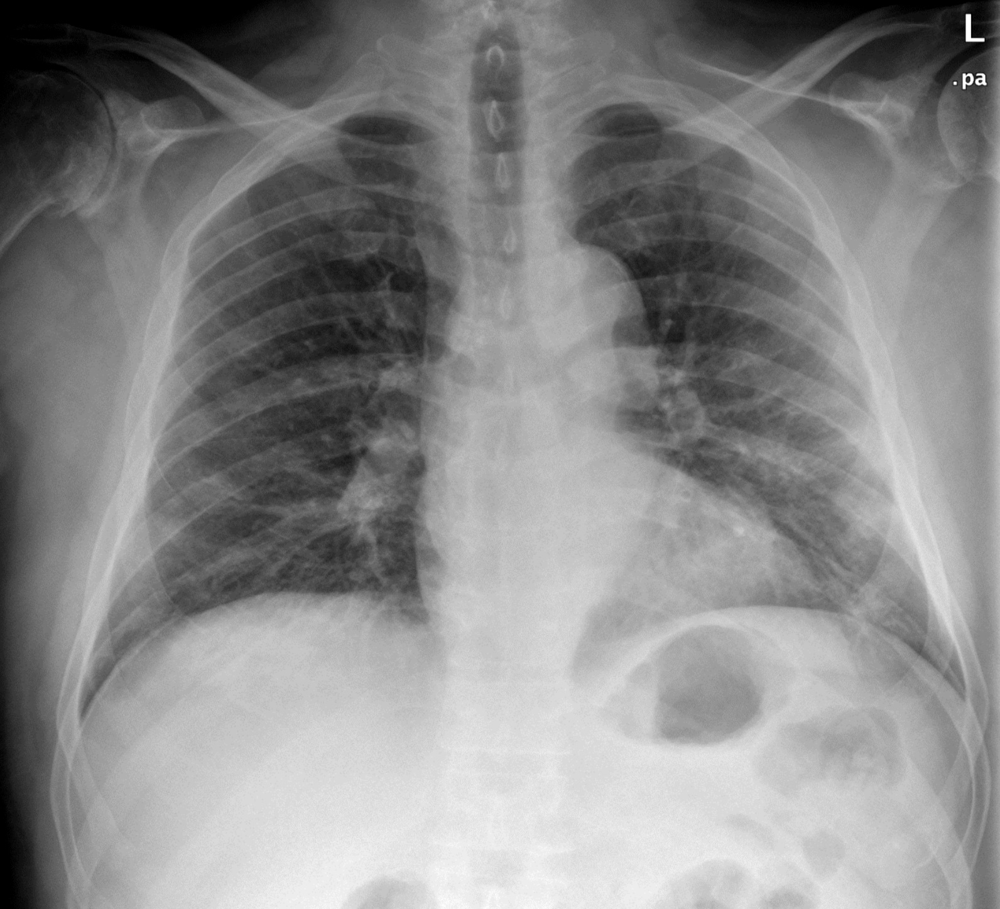

 20 


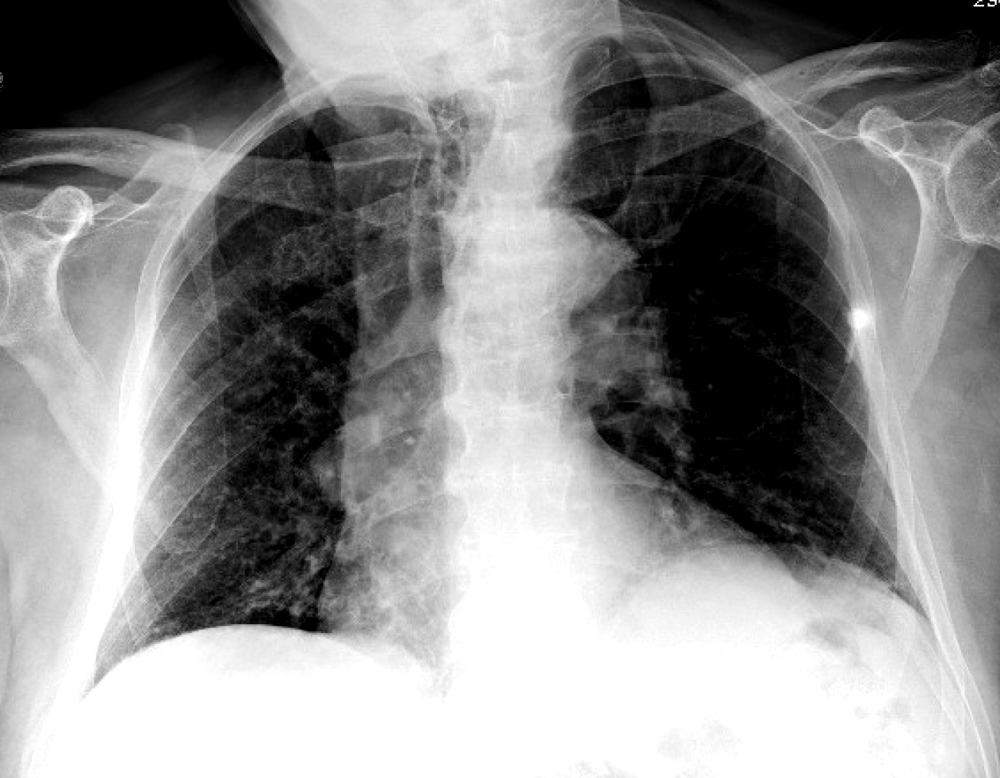

 21 


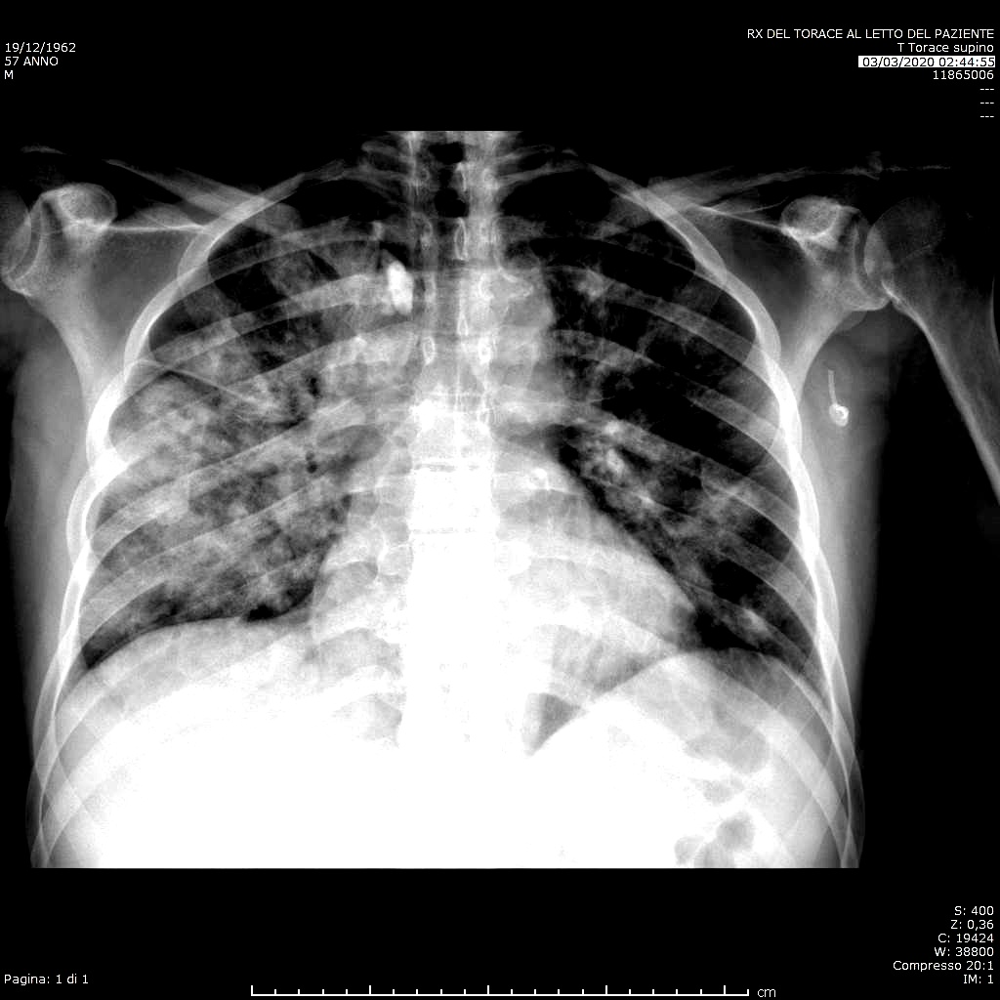

 22 


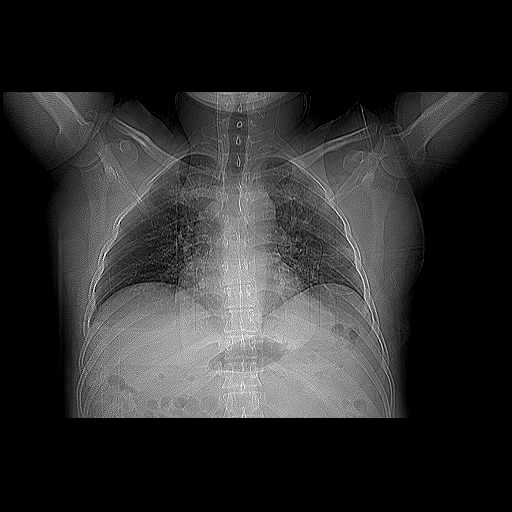

 23 


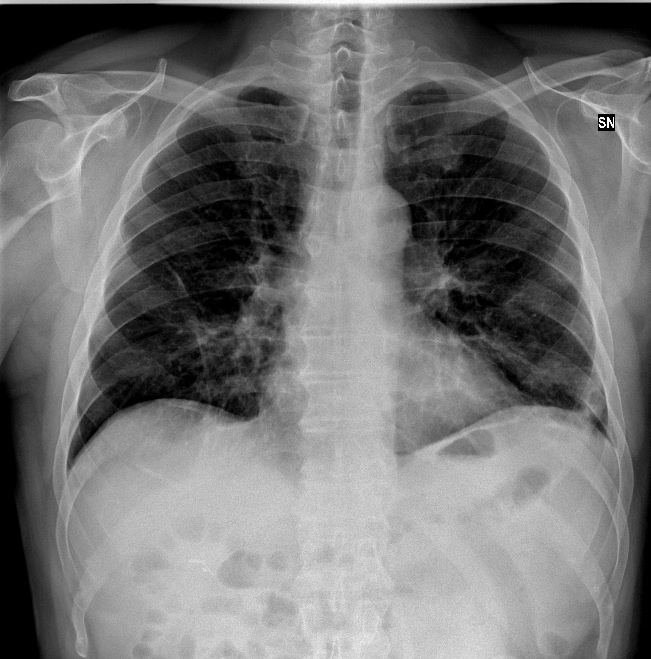

 24 


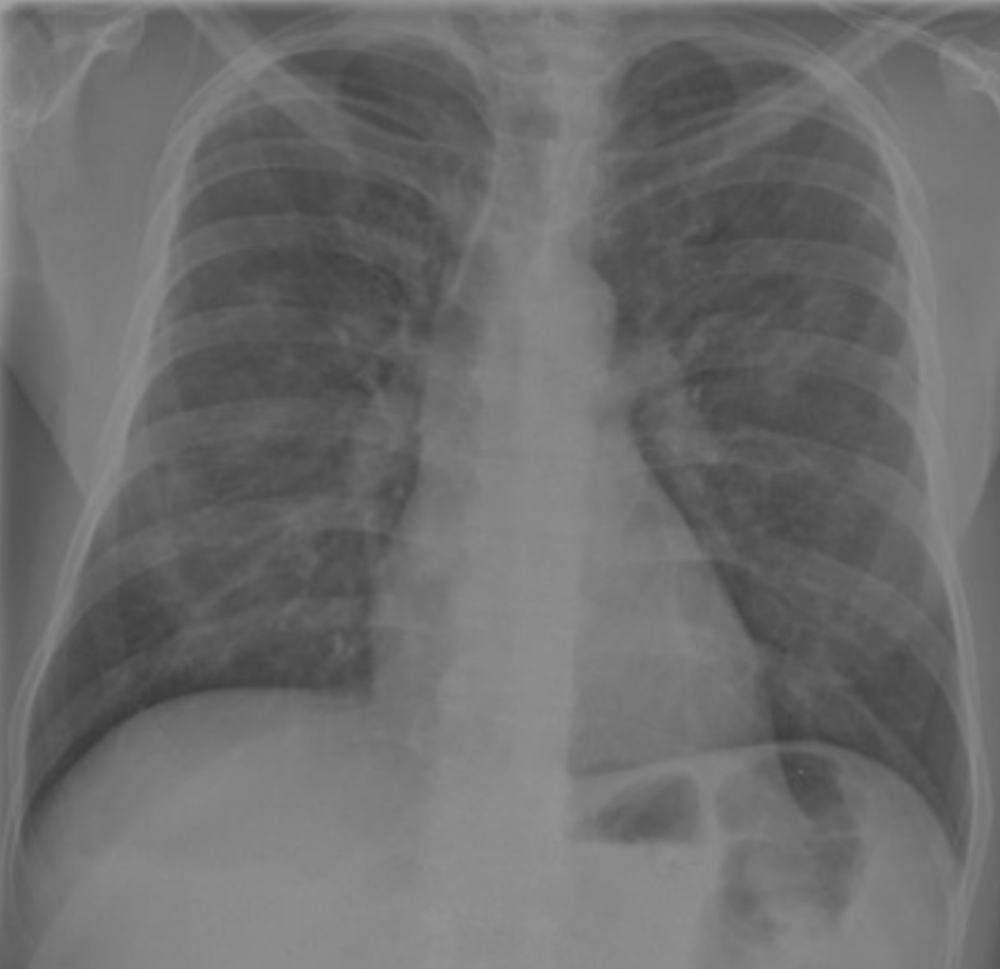

 25 


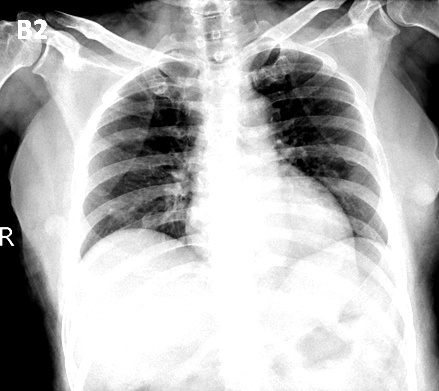

 26 


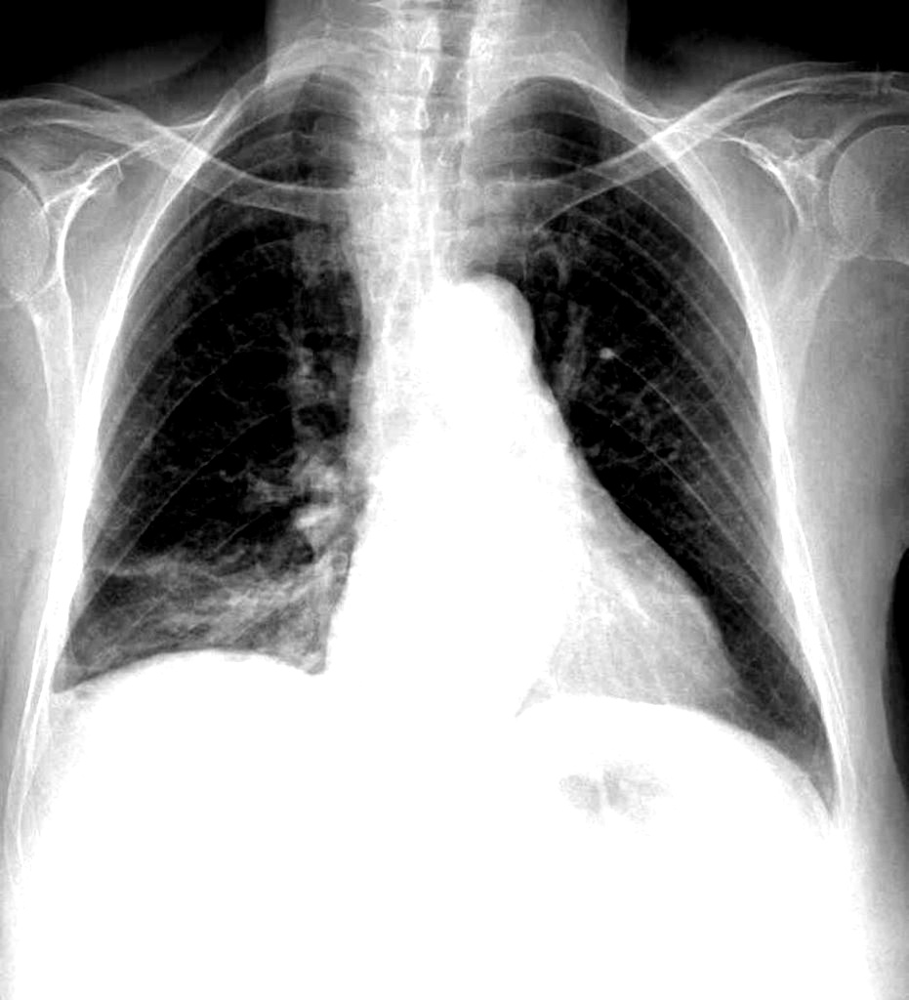

 27 


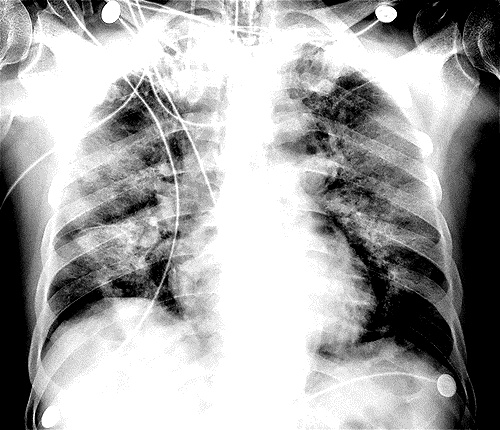

 28 


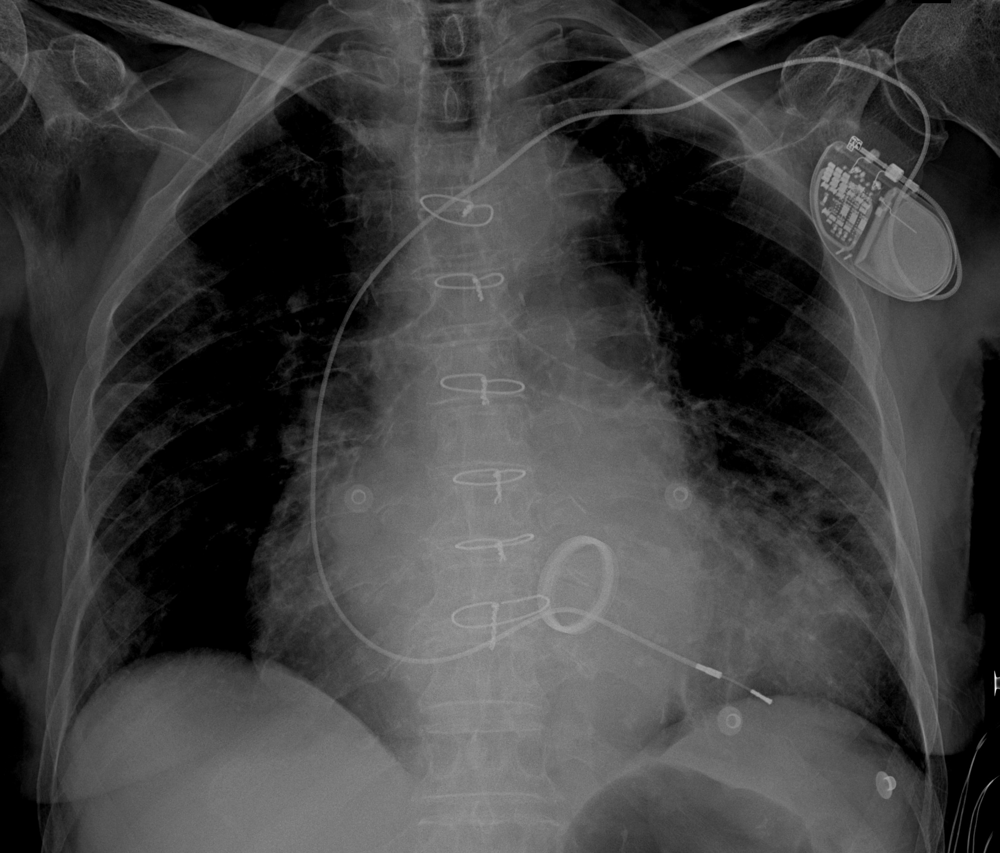

 29 


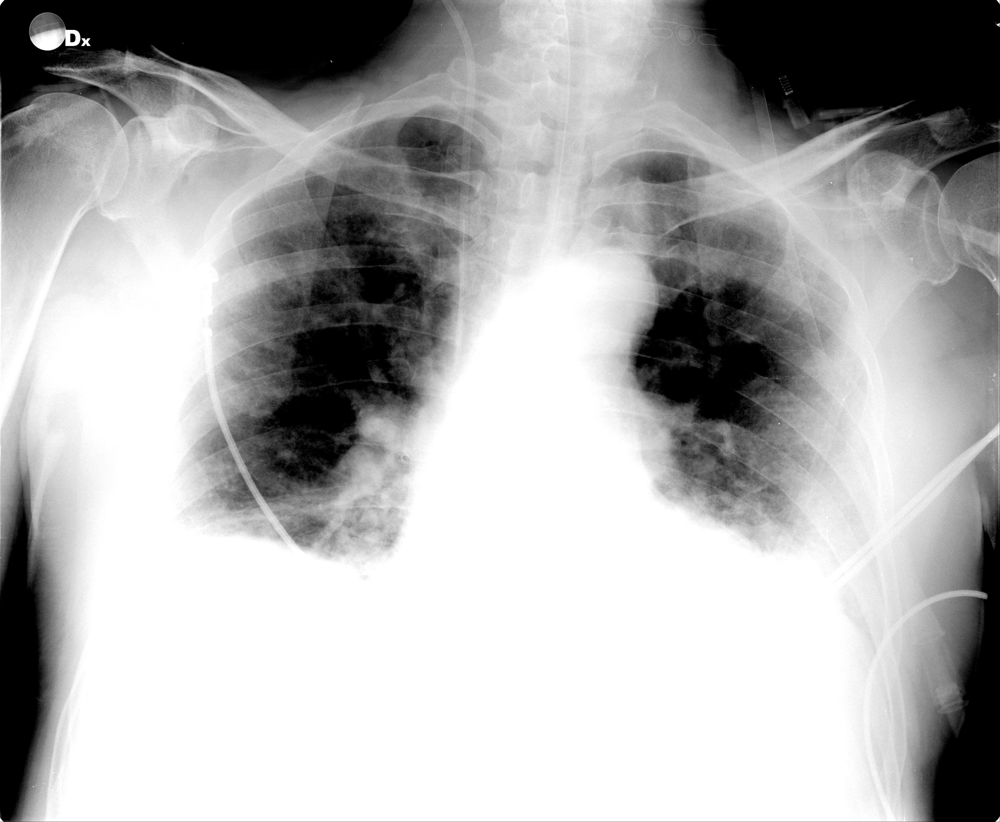

 30 


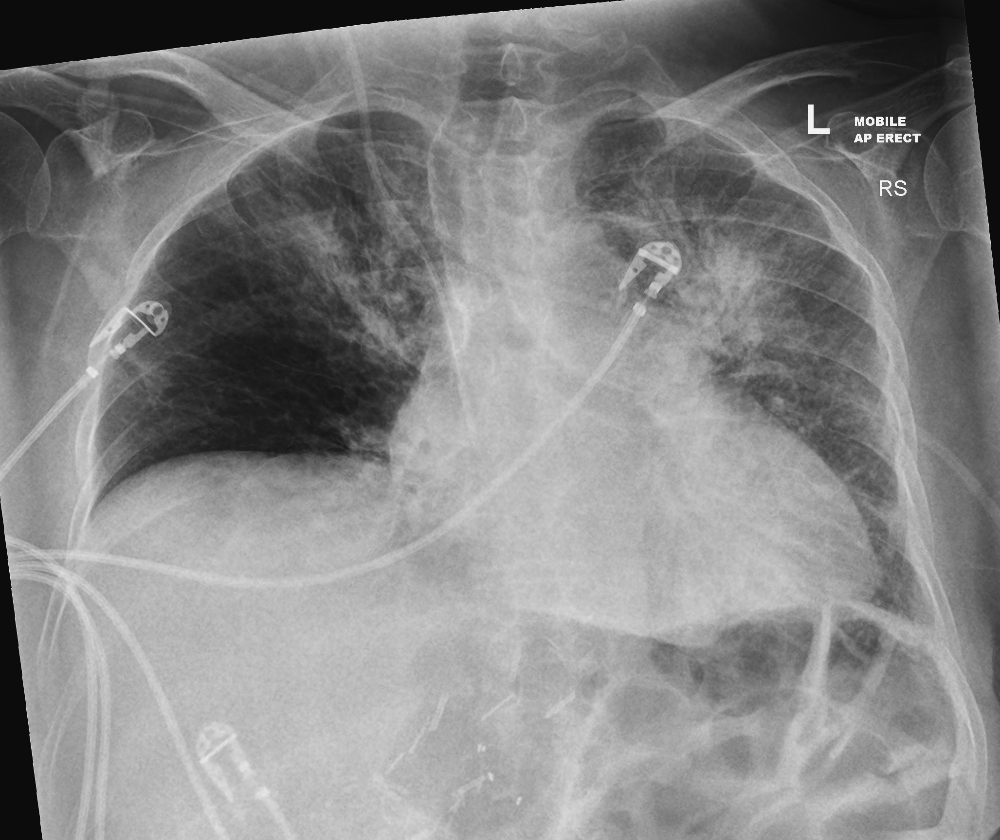

 31 


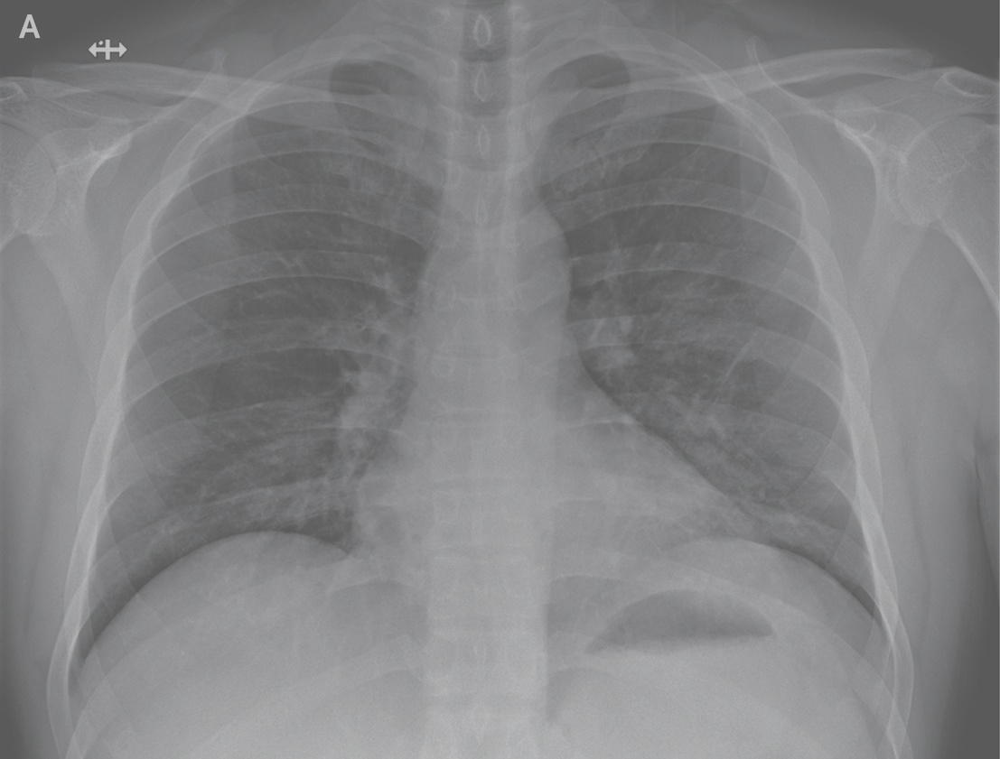

 32 


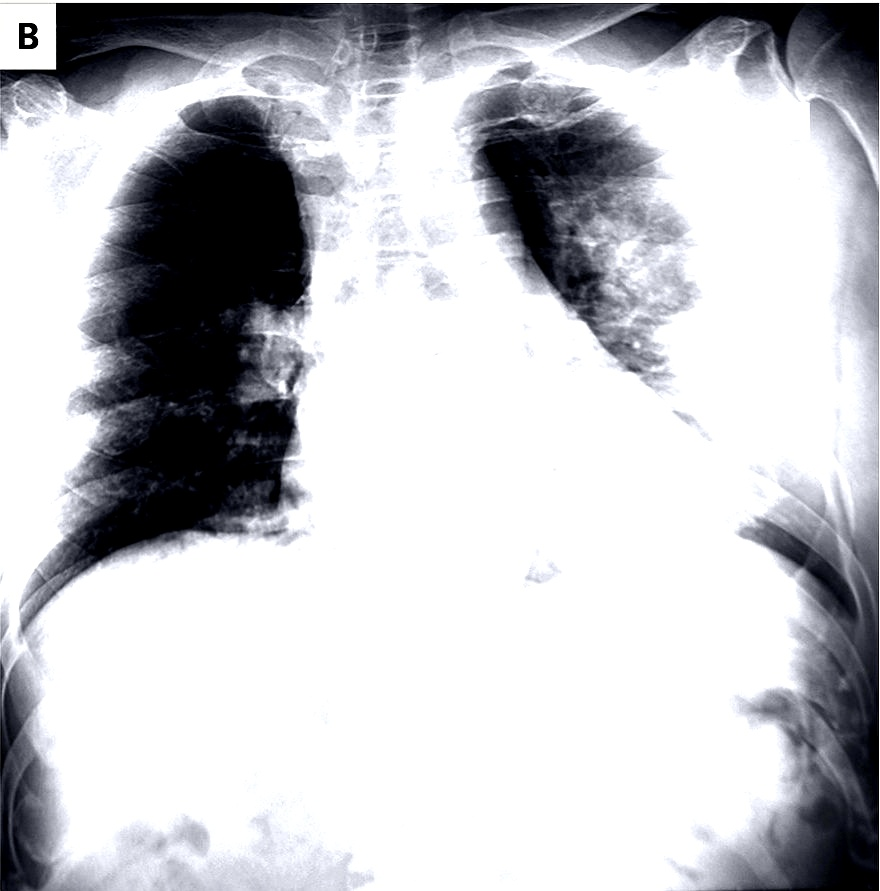

 33 


In [ ]:
print("[INFO] loading images...")
imagePaths = list(paths.list_images(args["dataset_1"]))
data = []
labels = []
count = 0
for imagePath in imagePaths:
	count = count + 1
	print("",count,"")
	label = imagePath.split(os.path.sep)[-2]
	image = cv2.imread(imagePath)
	image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
	image = cv2.resize(image, (224, 224))
	data.append(image)
	#labels.append(label)
data = np.array(data) / 255.0

In [ ]:
nsamples, nx, ny = data.shape
d2_train_dataset = data.reshape((nsamples,nx*ny))

In [ ]:
d2_train_dataset.shape

(115, 50176)

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
clustering = AgglomerativeClustering().fit(d2_train_dataset)

In [ ]:
clustering.labels_

In [ ]:
for label,skill in zip(clustering.labels_,d2_train_dataset):
  print(skill," : ",label)

In [ ]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
Z = linkage(d2_train_dataset)

In [ ]:
dendrogram(Z)  


In [ ]:
pca = PCA(n_components=100)
reduced = pca.fit_transform(d2_train_dataset)
reduced.shape

In [ ]:
reduced = pca.fit_transform(d2_train_dataset)


In [ ]:
reduced.shape

In [ ]:
dist = Elbow_k_mean(reduced)

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(reduced)

In [ ]:
for label,skill in zip(kmeans.labels_,reduced):
  print(skill," : ",label)

In [ ]:
def displayMatrix(matrix): 
      
    for row in matrix: 
        for element in row: 
            print(element, end =" ") 
        print() 
  

In [ ]:
def convertToSparseMatrix(matrix): 
  
    # creating an empty sparse  
    # matrix list 
    sparseMatrix =[] 
  
    # searching values greater  
    # than zero 
    for i in range(len(matrix)): 
        for j in range(len(matrix[0])): 
            if matrix[i][j] != 0 : 
  
                # creating a temporaray 
                # sublist 
                temp = [] 
  
                # appending row value, column  
                # value and element into the  
                # sublist  
                temp.append(i) 
                temp.append(j) 
                temp.append(matrix[i][j]) 
  
                # appending the sublist into 
                # the sparse matrix list 
                sparseMatrix.append(temp) 
  
    # displaying the sparse matrix 
    print("\nSparse Matrix: ")  
    #displayMatrix(sparseMatrix)
    return sparseMatrix               
  

In [ ]:
sparseMatrix = convertToSparseMatrix(d2_train_dataset)        

In [ ]:
spares_matrix = np.array(sparseMatrix)

In [ ]:
spares_matrix.shape

In [ ]:
pca = PCA(n_components=2)

In [ ]:
reduced = pca.fit_transform(spares_matrix)

In [ ]:
t = reduced.transpose()

In [ ]:
t.shape

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import (KNeighborsClassifier,
                               NeighborhoodComponentsAnalysis)
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [ ]:
d2_train_dataset[0]

In [ ]:
d2_train_dataset[1]

In [ ]:

kmeans = KMeans(n_clusters=5, random_state=0).fit(d2_train_dataset)

In [ ]:
pca = PCA(n_components=1)


In [ ]:
reduced = pca.fit_transform(d2_train_dataset)

In [ ]:
t = reduced.transpose()


In [ ]:
t.shape

In [ ]:
plot = plt.scatter(x=t, y=kmeans.labels_)

In [ ]:
from sklearn import metrics

In [ ]:
metrics.silhouette_score(d2_train_dataset, kmeans.labels_, metric='euclidean')

In [ ]:
metrics.calinski_harabasz_score(d2_train_dataset,  kmeans.labels_)

In [ ]:
from sklearn.metrics import davies_bouldin_score

In [ ]:
davies_bouldin_score(d2_train_dataset, kmeans.labels_)

In [ ]:
for label,skill in zip(kmeans.labels_,d2_train_dataset):
  print(skill," : ",label)

## Clustring - Visualization

In [ ]:
import time
import warnings

import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice
import pylab as pl
from sklearn.mixture import BayesianGaussianMixture

In [ ]:
pca = PCA(n_components=2)
reduced = pca.fit_transform(d2_train_dataset)
reduced.shape

(115, 2)

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=111)

In [ ]:
kmeans.fit(reduced)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=111, tol=0.0001, verbose=0)

In [ ]:
pl.figure('K-means with 3 clusters')

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

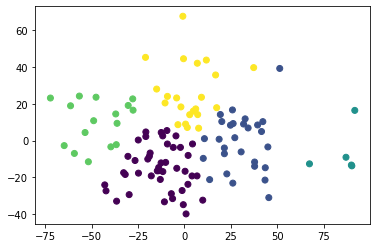

In [ ]:
pl.scatter(reduced[:, 0], reduced[:, 1], c=kmeans.labels_)

In [ ]:
clustering = AgglomerativeClustering(n_clusters=3).fit(reduced)

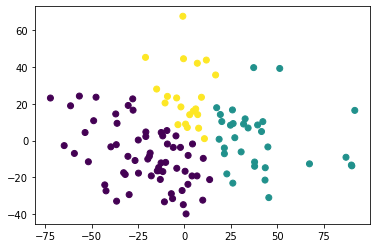

In [ ]:
pl.scatter(reduced[:, 0], reduced[:, 1], c=clustering.labels_)

In [ ]:
bayes = BayesianGaussianMixture(n_components = 3)

In [ ]:
bayes.fit(reduced)

/usr/local/lib/python3.6/dist-packages/sklearn/mixture/_base.py:267: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


BayesianGaussianMixture(covariance_prior=None, covariance_type='full',
                        degrees_of_freedom_prior=None, init_params='kmeans',
                        max_iter=100, mean_precision_prior=None,
                        mean_prior=None, n_components=3, n_init=1,
                        random_state=None, reg_covar=1e-06, tol=0.001,
                        verbose=0, verbose_interval=10, warm_start=False,
                        weight_concentration_prior=None,
                        weight_concentration_prior_type='dirichlet_process')

In [ ]:
 y_pred = bayes.predict(reduced)

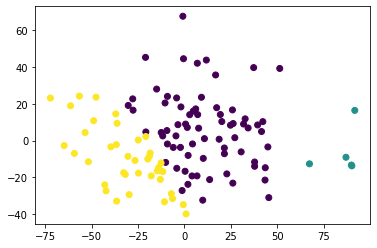

In [ ]:
pl.scatter(reduced[:, 0], reduced[:, 1], c=y_pred)

In [ ]:
for label,skill in zip(y_pred,reduced):
  print(skill," : ",label)

[-1.88459899 18.29053488]  :  0
[ 37.79433521 -11.68193744]  :  0
[-27.84197925  22.66581778]  :  0
[-18.87386632  -8.54360922]  :  2
[  0.88469879 -39.91047356]  :  2
[-64.74828612  -2.75150363]  :  2
[-10.77210197 -33.33164591]  :  2
[  6.78994203 -19.2382049 ]  :  0
[ 67.3453514  -12.66522513]  :  1
[-20.7700552    4.67614455]  :  0
[  9.86547806 -32.4323605 ]  :  0
[-36.52349467 -32.97304875]  :  2
[ 4.77289629 16.01660233]  :  0
[-24.853842     0.28973125]  :  2
[-3.49328972  8.63304756]  :  0
[ 45.44051892 -31.03751052]  :  0
[11.80407878 43.77968459]  :  0
[-17.841387   -19.21645248]  :  2
[-48.87756554  10.79394811]  :  2
[32.6967165  11.80285081]  :  0
[-11.68445283   2.5207717 ]  :  0
[-47.59954027  23.57950638]  :  2
[-36.27866703   9.37047285]  :  2
[7.65005221 6.72837913]  :  0
[-9.17058981 -1.87915929]  :  0
[-14.96286723  28.00824747]  :  0
[ -6.37676685 -31.58969149]  :  2
[  1.88012651 -23.80738456]  :  0
[-10.1062247  -11.88554321]  :  0
[-30.42831292  -8.59529221]  :